In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport

In [3]:
df = pd.read_csv('Dataset/BankChurners.csv')
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [4]:
# Drop irrelevant columns
df = df.drop(["CLIENTNUM", 
              "Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1", 
              "Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2"
             ], axis=1)
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


### EDA

In [5]:
credit_card_report = ProfileReport(df)
credit_card_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Data Preprocessing

In [5]:
# Check missing values
df.isna().sum()

Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

From the output above and ProfileReport above, there is no NA value. Hence, we do not need to handle missing values. 

It may be necessary to inspect the 0 values as well, since it maybe used as placeholder for NA value. 
Here are 4 columns with 0 values: Contacts_Count_12_mon (3.9%), Dependent Count (8.9%), Total_Revolving_Balance (24.4%), Avg_Utilization_Ratio (24.4%). Based on domain knowledge, these zero values are reasonable. So we keep them. 

### Feature Engineering

In [ ]:
# Encode categorical values
categorical_columns = df.select_dtypes(exclude=['int64','float64']).columns
categorical_columns

Index(['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category'],
      dtype='object')

In [ ]:
# Check the unique values of each categorical column
print(df['Attrition_Flag'].unique())
print(df['Gender'].unique())
print(df['Marital_Status'].unique())
print(df['Card_Category'].unique())
print(df['Education_Level'].unique())
print(df['Income_Category'].unique())

['Existing Customer' 'Attrited Customer']
['M' 'F']
['Married' 'Single' 'Unknown' 'Divorced']
['Blue' 'Gold' 'Silver' 'Platinum']
['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']
['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']


In [6]:
# Encode binary features
df['Attrition_Flag'] = df['Attrition_Flag'].map({'Attrited Customer':1, 'Existing Customer':0}) # Target variable
df['Gender'] = df['Gender'].map({'M':1, 'F':0})

# Encode non-ordinal feature
df = pd.get_dummies(df, columns=['Marital_Status'], drop_first=True) # One-hot encode Marital_Status

# Encode ordinal features
df['Card_Category'] = df['Card_Category'].map({'Blue':0, 'Silver':1, 'Gold':2, 'Platinum':3})
# Handle 'Unknown' values by replacing them with the mode of the column
df['Education_Level'] = df['Education_Level'].replace('Unknown', df['Education_Level'].mode()[0])
df['Education_Level'] = df['Education_Level'].map({'Uneducated':0, 'High School':1, 'College':2, 'Graduate':3, 'Post-Graduate':4, 'Doctorate':5})
# Handle 'Unknown' values by replacing them with the mode of the column
df['Income_Category'] = df['Income_Category'].replace('Unknown', df['Income_Category'].mode()[0])
df['Income_Category'] = df['Income_Category'].map({'Less than $40K':0, '$40K - $60K':1, '$60K - $80K':2, '$80K - $120K':3, '$120K +':4})

From the Profile Report above, around 11% of 'Income_Category' and 15% of 'Education_Level' are recorded as "Unknown". This proportion is not negligible, so we decided to keep them as impute with mode.

### Model training

In [10]:
%matplotlib inline

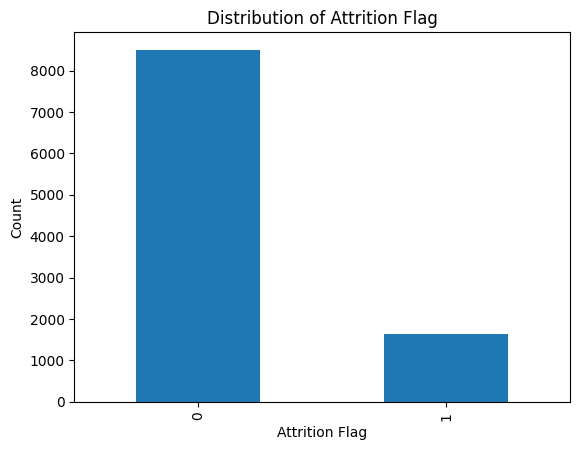

In [11]:
df['Attrition_Flag'].value_counts().plot(kind='bar')
plt.xlabel('Attrition Flag')
plt.ylabel('Count')
plt.title('Distribution of Attrition Flag')
plt.show()

The dataset is highly unbalanced, which would affect model training. We will try a few strategies: 
1. Class weighting
2. SMOTE

The “balanced” mode uses the values of y to automatically adjust weights inversely proportional to class frequencies in the input data as n_samples / (n_classes * np.bincount(y)).
https://www.geeksforgeeks.org/how-does-the-classweight-parameter-in-scikit-learn-work/ 

Result from experiment: 
- class_weight = "balanced"/ scale_pos_weight=sum(y_train == 0) / sum(y_train == 1)
  - Better for LR, XGBoost;
  - worse for RV
- SMOTE
    - Improve for all 
    - LR XGBoost
- Compare
    - Class_weight comparable to SMOTE (require fine-tuning) for LR, XGBoost
    - SMOTE better for RV


In [82]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, f1_score, roc_auc_score, roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import shap

In [30]:
X = df.drop('Attrition_Flag', axis=1)
y = df['Attrition_Flag']

# Split the dataset into training and testing sets with stratified split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42) 

In [135]:
# Initialize the Logistic Regression model with class_weight='balanced'
lr_model = LogisticRegression(class_weight='balanced')

# Train the model
lr_model.fit(X_train, y_train)

# Make predictions
y_pred = lr_model.predict(X_test)
y_prob = lr_model.predict_proba(X_test)[:, 1]

# Evaluate the model
# print("Classification Report:")
# print(classification_report(y_test, y_pred))

# print("Confusion Matrix:")
# print(confusion_matrix(y_test, y_pred))

f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_prob)
print("F1 Score:", f1)
print("ROC AUC Score:", roc_auc)

F1 Score: 0.5966101694915255
ROC AUC Score: 0.8889069777958666


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
# Initialize the Random Forest model with class_weight='balanced'
rv_model = RandomForestClassifier()

# Train the model
rv_model.fit(X_train, y_train)

# Make predictions
y_pred = rv_model.predict(X_test)
y_prob = rv_model.predict_proba(X_test)[:, 1]

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_prob)
print("F1 Score:", f1)
print("ROC AUC Score:", roc_auc)

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.99      0.98      1701
           1       0.94      0.78      0.86       325

    accuracy                           0.96      2026
   macro avg       0.95      0.89      0.92      2026
weighted avg       0.96      0.96      0.96      2026

Confusion Matrix:
[[1686   15]
 [  70  255]]
F1 Score: 0.8571428571428571
ROC AUC Score: 0.9844363044363045


In [146]:
# Initialize the XGBoost model
xgb_model = XGBClassifier(scale_pos_weight=sum(y_train == 0) / sum(y_train == 1))

# Train the model
xgb_model.fit(X_train, y_train)

# Make predictions
y_pred_xgb = xgb_model.predict(X_test)
y_prob_xgb = xgb_model.predict_proba(X_test)[:, 1]

# Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred_xgb))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_xgb))

f1 = f1_score(y_test, y_pred_xgb, average='weighted')
roc_auc = roc_auc_score(y_test, y_prob_xgb)
print("F1 Score:", f1)
print("ROC AUC Score:", roc_auc)

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1701
           1       0.91      0.89      0.90       325

    accuracy                           0.97      2026
   macro avg       0.95      0.94      0.94      2026
weighted avg       0.97      0.97      0.97      2026

Confusion Matrix:
[[1673   28]
 [  35  290]]
F1 Score: 0.9687669091461667
ROC AUC Score: 0.9920336453669787


### Feature Importance

Feature ranking:
1. feature Total_Trans_Amt (0.17685871086437338)
2. feature Total_Trans_Ct (0.16677797395427288)
3. feature Total_Ct_Chng_Q4_Q1 (0.11489984970581466)
4. feature Total_Revolving_Bal (0.10794931095553326)
5. feature Total_Relationship_Count (0.07201075675927479)
6. feature Total_Amt_Chng_Q4_Q1 (0.06056915808395415)
7. feature Avg_Utilization_Ratio (0.05978410937806612)
8. feature Customer_Age (0.03455324820684687)
9. feature Credit_Limit (0.034342347293122875)
10. feature Avg_Open_To_Buy (0.033406735755156326)
11. feature Contacts_Count_12_mon (0.027266923104691542)
12. feature Months_Inactive_12_mon (0.026154456149532698)
13. feature Months_on_book (0.02546208398632149)
14. feature Dependent_count (0.013220134887944806)
15. feature Education_Level (0.011167146137847734)
16. feature Income_Category (0.010359060749786797)
17. feature Gender (0.009137517067141311)
18. feature Marital_Status_Married (0.00596012994819886)
19. feature Marital_Status_Single (0.0050063040853952

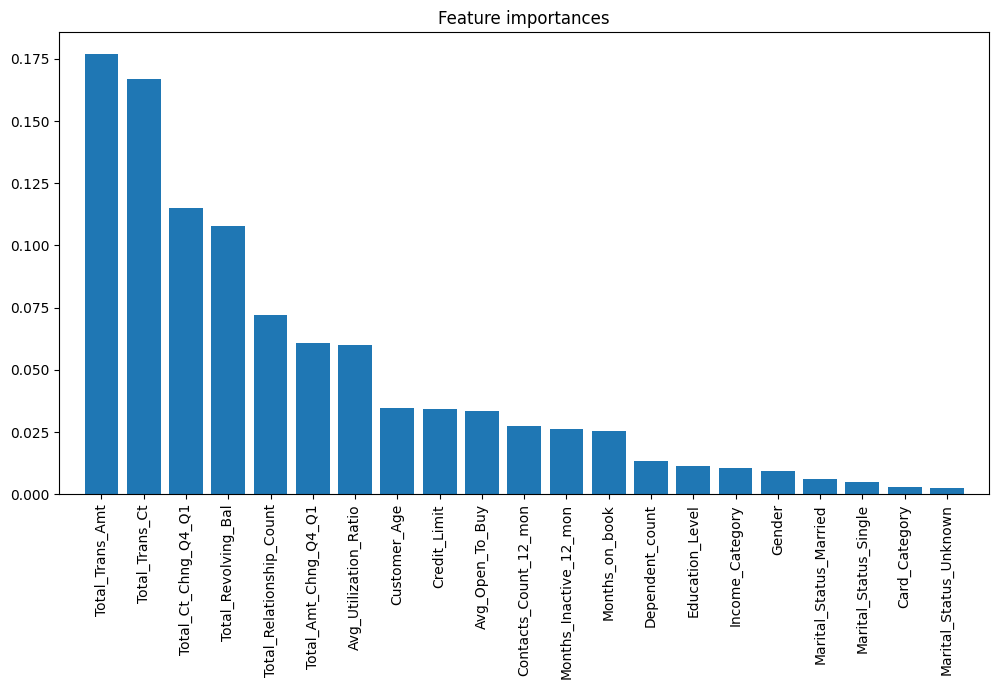

In [24]:
# Random Forest Feature Importance
importances = rv_model.feature_importances_
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(X.shape[1]):
    print(f"{f + 1}. feature {X.columns[indices[f]]} ({importances[indices[f]]})")

# Plot the feature importances of the forest
plt.figure(figsize=(12, 6))
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices], align="center")
plt.xticks(range(X.shape[1]), X.columns[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()

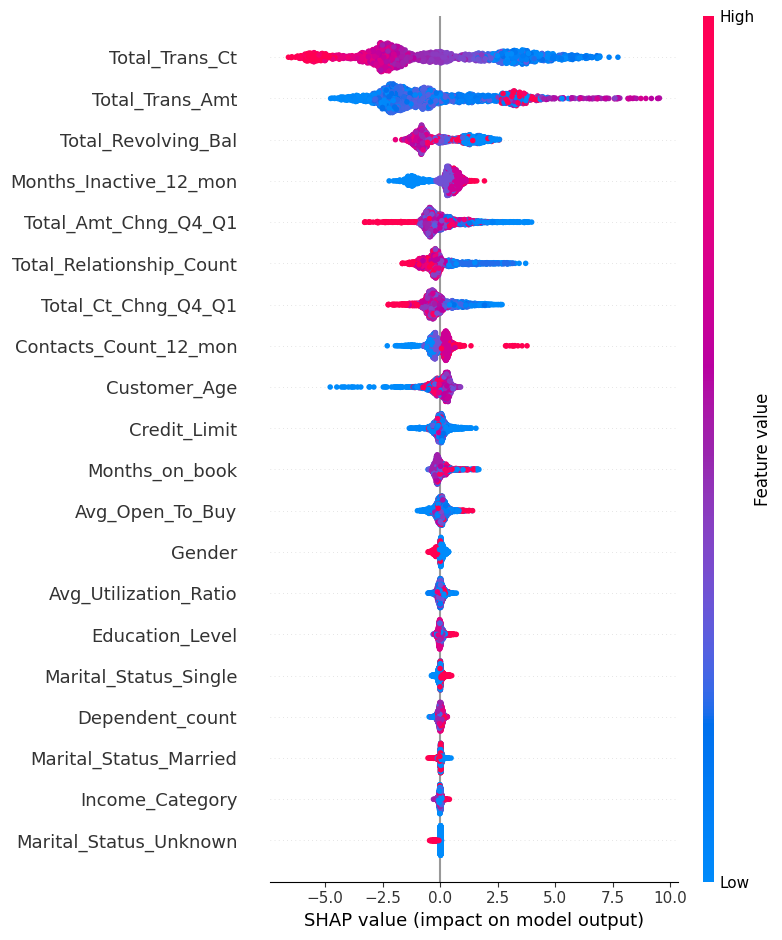

In [25]:
# XGBoost explainer using SHAP
X_train = X_train.astype(float)  # Convert everything to float to avoid errors for SHAP
X_test = X_test.astype(float)

explainer = shap.Explainer(xgb_model, X_train)  # Tree-based SHAP explainer for XGBoost
shap_values = explainer(X_test)  # Compute SHAP values for test data

shap.summary_plot(shap_values, X_test)


### SMOTE
SMOTE is a technique to generate new samples in the feature space by interpolating between samples of the minority class. SMOTE works by selecting examples that are close in the feature space, drawing a line between the examples in the feature space and drawing a new sample at a point along that line. 
https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/

- AUC-ROC is a performance measurement for the classification problems at various threshold settings. ROC is a probability curve and AUC represents the degree or measure of separability. It tells how much the model is capable of distinguishing between classes. Higher the AUC, better the model is at predicting 0s as 0s and 1s as 1s. 


In [138]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(sampling_strategy=0.45, random_state=42)  # Adjust ratio as needed
X_resampled, y_resampled = smote.fit_resample(X_train, y_train) # Apply SMOTE on training data


In [44]:
from collections import Counter
print("Original class distribution:", Counter(y))
print("Resampled class distribution:", Counter(y_resampled))

Original class distribution: Counter({0: 8500, 1: 1627})
Resampled class distribution: Counter({0: 8500, 1: 4250})


In [ ]:
xgb_model = XGBClassifier()

# Train the model
xgb_model.fit(X_resampled, y_resampled)

# Make predictions
y_pred_xgb = xgb_model.predict(X_test)
y_prob = xgb_model.predict_proba(X_test)[:, 1]

# Evaluate the model
f1 = f1_score(y_test, y_pred_xgb)
roc_auc = roc_auc_score(y_test, y_prob)
print("F1 Score:", f1)
print("ROC AUC Score:", roc_auc)

F1 Score: 0.5520361990950227
ROC AUC Score: 0.8614245014245012


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Ratio: 0.3, F1-score: 0.9680, AUC-ROC: 0.9917
Ratio: 0.325, F1-score: 0.9666, AUC-ROC: 0.9922
Ratio: 0.35000000000000003, F1-score: 0.9681, AUC-ROC: 0.9920
Ratio: 0.37500000000000006, F1-score: 0.9687, AUC-ROC: 0.9918
Ratio: 0.4000000000000001, F1-score: 0.9672, AUC-ROC: 0.9915
Ratio: 0.4250000000000001, F1-score: 0.9672, AUC-ROC: 0.9914
Ratio: 0.4500000000000001, F1-score: 0.9698, AUC-ROC: 0.9921
Ratio: 0.47500000000000014, F1-score: 0.9673, AUC-ROC: 0.9916
Ratio: 0.5000000000000002, F1-score: 0.9682, AUC-ROC: 0.9909
Ratio: 0.5250000000000001, F1-score: 0.9682, AUC-ROC: 0.9916
Ratio: 0.5500000000000003, F1-score: 0.9651, AUC-ROC: 0.9917
Ratio: 0.5750000000000002, F1-score: 0.9698, AUC-ROC: 0.9914
Ratio: 0.6000000000000003, F1-score: 0.9653, AUC-ROC: 0.9915
Ratio: 0.6250000000000002, F1-score: 0.9671, AUC-ROC: 0.9914
Ratio: 0.6500000000000004, F1-score: 0.9686, AUC-ROC: 0.9908
Ratio: 0.6750000000000003, F1-score: 0.9687, AUC-ROC: 0.9913
Ratio: 0.7000000000000004, F1-score: 0.9683, AUC-

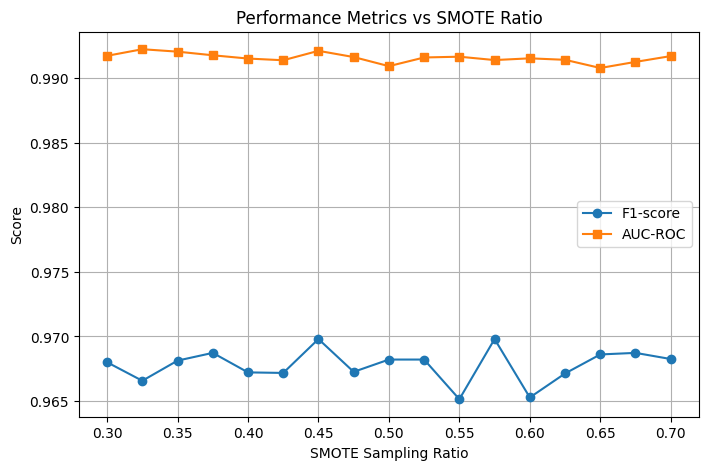

In [147]:
# Define different SMOTE ratios to test
sampling_ratios = np.arange(0.3, 0.71, 0.025)

results = []

for ratio in sampling_ratios:
    # Apply SMOTE with the current ratio
    smote = SMOTE(sampling_strategy=ratio, random_state=42)
    X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

    # Train logistic regression model
    model = XGBClassifier()
    model.fit(X_resampled, y_resampled)

    # Make predictions on the test set
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]

    # Calculate evaluation metrics
    f1 = f1_score(y_test, y_pred, average='weighted')
    roc_auc = roc_auc_score(y_test, y_prob)

    results.append({'Ratio': ratio, 'F1-score': f1, 'AUC-ROC': roc_auc})

    print(f"Ratio: {ratio}, F1-score: {f1:.4f}, AUC-ROC: {roc_auc:.4f}")

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Plot the results
plt.figure(figsize=(8, 5))
plt.plot(results_df['Ratio'], results_df['F1-score'], marker='o', label='F1-score')
plt.plot(results_df['Ratio'], results_df['AUC-ROC'], marker='s', label='AUC-ROC')
plt.xlabel('SMOTE Sampling Ratio')
plt.ylabel('Score')
plt.title('Performance Metrics vs SMOTE Ratio')
plt.legend()
plt.grid(True)
plt.show()

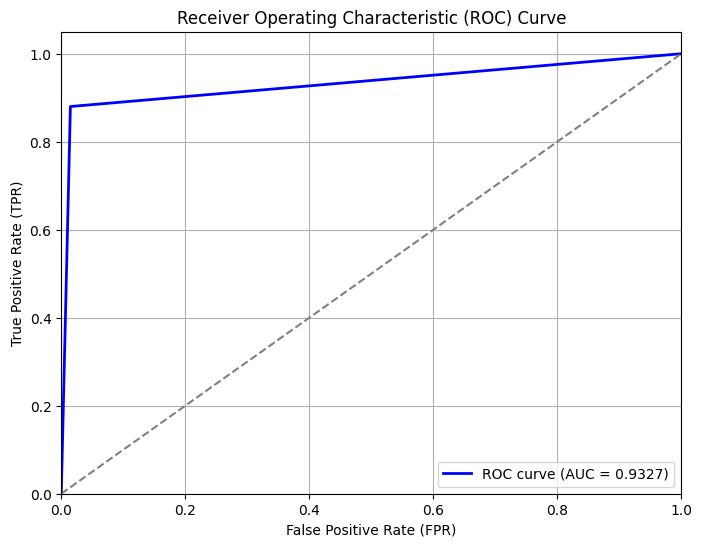

In [81]:
from sklearn.metrics import roc_curve, auc
fpr, tpr, _ = roc_curve(y_test, y_pred_xgb)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Diagonal line (random guess)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()